In [1]:
# useful link
# https://downloads.esri.com/esri_content_doc/dbl/us/Var_List_ACS_Spring_2021.pdf

"""
Notes:
- all latinos of any race are counted as latino
- all other races are the "xxx-only" category
- mixed is only non-latino mixed

"""

import pandas as pd
from nycschools import schools, geo, ui
import geopandas as gpd
import requests
from requests import Session
from types import SimpleNamespace
import random
from shapely.geometry import Point
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Markdown as md
from concurrent.futures import ThreadPoolExecutor, as_completed
import os


api_key = os.environ["CENSUS_API_KEY"]


census_pretty = {
    "B01003_001E": "Total Population",
    "B19013_001E": "Median Household Income",
    "B25001_001E": "Total Housing Units",
    "B25002_002E": "Occupied Housing Units",
    "B03002_001E": "Total Population - Race",
    "B03002_003E": "White Alone",
    "B03002_004E": "Black or African American Alone",
    "B03002_012E": "Hispanic or Latino",
    "B17001_002E": "Poverty Status - Below Poverty Level",
    "B22002_002E": "Households - With Children",
    "P008003": "White Population",
    "NAME": "Name",
    "B08012_001E": "# of Commuters",
    "B08012_002E": "Less than 5 Minutes",
    "B08012_003E": "5-9 Minutes",
    "B08012_004E": "10-14 Minutes",
    "B08012_005E": "15-19 Minutes",
    "B08012_006E": "20-24 Minutes",
    "B08012_007E": "25-29 Minutes",
    "B08012_008E": "30-34 Minutes",
    "B08012_009E": "35-39 Minutes",
    "B08012_010E": "40-44 Minutes",
    "B08012_011E": "45-59 Minutes",
    "B08012_012E": "60-89 Minutes",
    "B08012_013E": ">90 Minutes",
    "GEO_ID": "GEOID"
    # Add more variables as needed
}
cv = {
    "name": "NAME",
    "total_pop": "B01003_001E",
    "median_inc": "B19013_001E",
    "total_housing": "B25001_001E",
    "occupied_housing": "B25002_002E",
    "total_pop_race": "B03002_001E",
    "asian": "B03002_006E",
    "black": "B03002_004E",
    "indian": "B03002_005E",
    "latino": "B03002_012E",
    "mixed": "B03002_009E",
    "other": "B03002_008E",
    "pacific": "B03002_007E",
    "white": "B03002_003E",
    "white_pop": "P008003",
    "poverty": "B17001_002E",
    "geoid": "GEO_ID"
}
col_names = {v:k for k,v in cv.items()}
cv = SimpleNamespace(**cv)

race = [ cv.asian, cv.black, cv.indian, cv.latino, cv.mixed, cv.other, cv.pacific, cv.white ]
race_cols = [ "asian", "black", "indian", "latino", "mixed", "other", "pacific", "white" ]


def fetch_census_data(years, api_key, counties, variables):
    if type(years) == int:
        years = [years]
    

    def get_data(year):
        base_url = "https://api.census.gov/data"
        endpoint = "acs/acs5"
        url = f"{base_url}/{year}/{endpoint}?get={','.join(variables)}&for=tract:*&in=state:36%20county:{counties}&key={api_key}"
        response = session.get(url)
        if response.status_code == 200:
            data = response.json()
            columns = data[0]
            df = pd.DataFrame(data[1:], columns=columns)
            df["year"] = year
            return df
        else:
            print(f"Error fetching data for {year}. Status Code: {response.status_code}")
            return None
    
    session = Session()
    with ThreadPoolExecutor(max_workers=10) as executor:
        results = [executor.submit(get_data, year) for year in years]
        results = [r.result() for r in as_completed(results)]
    try:
        df = pd.concat(results, axis=0, ignore_index=True)
        df.rename(columns=col_names, inplace=True)
        df.geoid = df.geoid.str[-11:]
        df.median_inc = df.median_inc.astype(float)
        df.total_pop = df.total_pop.astype(int)
        for c in race_cols:
            df[c] = df[c].astype(int)
        session.close()
        return df
    except Exception as e:
        print(e)
        session.close()
        return pd.DataFrame()

def get_tracts():
    url = "https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Census_Tracts_for_2020_US_Census/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson"
    tracts = gpd.read_file(url)
    tracts.columns = tracts.columns.str.lower()
    return tracts


vars = [cv.name, cv.geoid, cv.median_inc, cv.total_pop] + race
counties = "005,047,061,085,081"
years = range(2010, 2023)
df = fetch_census_data(years, api_key, counties, vars)

In [2]:


tracts = get_tracts()
data = tracts[["geoid", "geometry"]].merge(df, on="geoid", how="inner")
data.to_file("census.geojson", driver="GeoJSON")

no_inc = data[data.median_inc < 0]
data = data[data.median_inc >= 0]
data.head()

,geoid,geometry,name,median_inc,total_pop,asian,black,indian,latino,mixed,other,pacific,white,state,county,tract,year
13,36061000201,"POLYGON ((-73.98450 40.70952, -73.98655 40.709...","Census Tract 2.01, New York County, New York",18831.0,3013,1403,382,0,1072,31,24,0,101,36,061,000201,2010
14,36061000201,"POLYGON ((-73.98450 40.70952, -73.98655 40.709...","Census Tract 2.01, New York County, New York",20521.0,2791,1288,172,0,985,0,0,0,346,36,061,000201,2015
15,36061000201,"POLYGON ((-73.98450 40.70952, -73.98655 40.709...","Census Tract 2.01, New York County, New York",20304.0,2799,1113,164,0,1421,16,0,0,85,36,061,000201,2011
16,36061000201,"POLYGON ((-73.98450 40.70952, -73.98655 40.709...","Census Tract 2.01, New York County, New York",19333.0,2824,1328,184,0,927,15,0,0,370,36,061,000201,2013
17,36061000201,"POLYGON ((-73.98450 40.70952, -73.98655 40.709...","Census Tract 2.01, New York County, New York",17282.0,2773,1249,150,0,1187,13,0,0,174,36,061,000201,2012


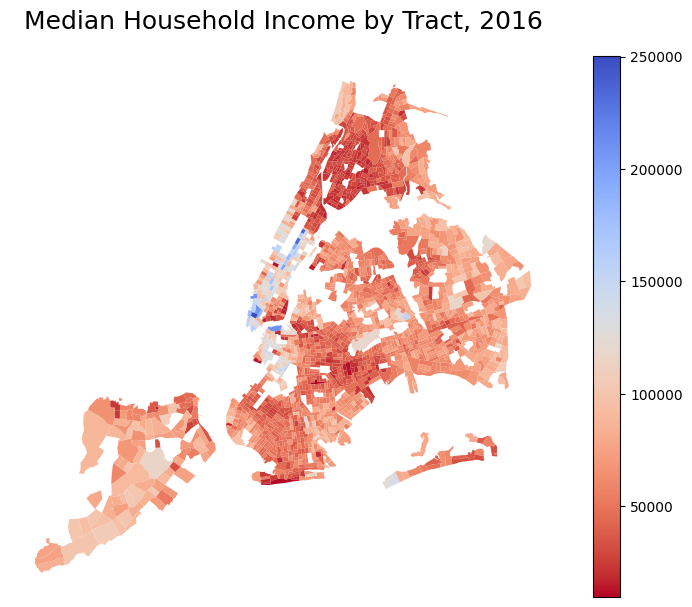

In [3]:
fig, ax = plt.subplots(figsize=(8, 6))

data[data.year==2016].plot(ax=ax, column="median_inc", legend=True, cmap="coolwarm_r")
sns.set_context('talk')
plt.axis('off')
fig.tight_layout()
ax.set_title('Median Household Income by Tract, 2016', pad=20)
plt.show()

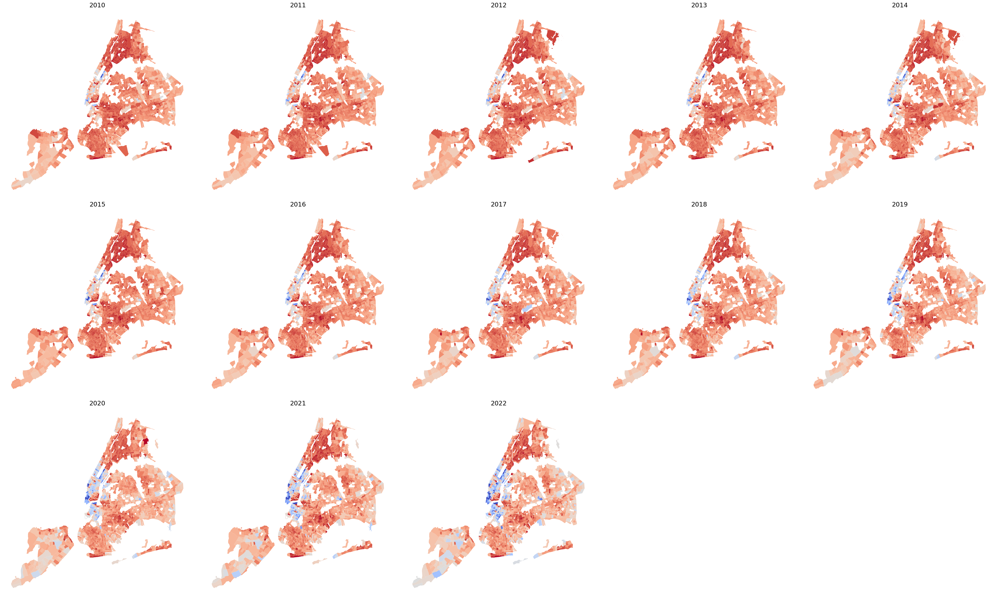

In [4]:
import math
sns.set_context('talk')
cols = 5
rows = math.ceil(len(years) / cols)
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(8*cols, 8*rows))

for ax, year in zip(axs.flat, years):
    # Filter data for the current year and plot
    data_year = data[data.year == year]
    data_year.plot(ax=ax, column="median_inc", cmap="coolwarm_r", legend=False)
    ax.set_title(f'{year}', pad=10)
    ax.axis('off')

# Remove any unused axes
for ax in axs.flat[len(years):]:
    ax.axis('off')

fig.tight_layout()
plt.show()

In [10]:
import folium
from itertools import chain
colors = {
    "asian": "red",
    "black": "blue",
    # "indian": "pink",
    "latino": "green",
    # "mixed": "yellow",
    # "other": "grey",
    # "pacific": "orange",
    "white": "purple",
}


def get_pop_marker(row):
    ratio = 10
    results = []
    for c, color in colors.items():

        num_points = row[c] // ratio

        geometry = row.geometry
        minx, miny, maxx, maxy = geometry.bounds

        def generate_random_point_within():

            x = random.uniform(minx, maxx)
            y = random.uniform(miny, maxy)
            p = Point(x, y)
            if p.within(geometry):
                return (x, y, color)
            return generate_random_point_within()

        points = []
        for i in range(num_points):
            points.append(generate_random_point_within())
        if(len(points) > 0):
            results.append(points)
    return results


x = data[data.year == 2020]

points = x.apply(get_pop_marker, axis=1)
points = list(chain(*points))

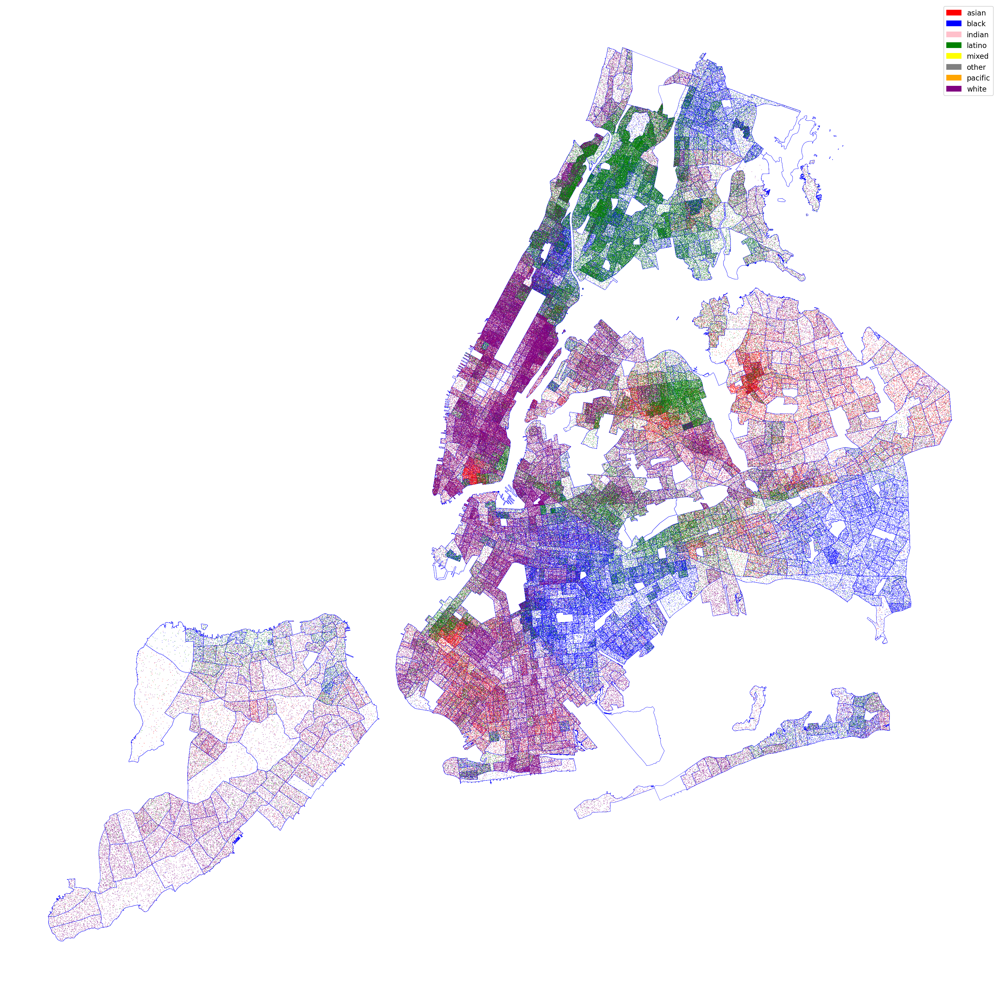

In [11]:
import matplotlib.patches as mpatches

results = []
for p in points:
    results += p

fig, ax = plt.subplots(figsize=(32, 32))
sns.set_context('talk')
plt.axis('off')
fig.tight_layout()




ax = data.plot(ax=ax, color='white', edgecolor='blue', linewidth=0.5)

x_coords, y_coords, colors = zip(*results)

ax.scatter(x_coords, y_coords, c=colors, s=1, edgecolor='none') 
legend = {
    "asian": "red",
    "black": "blue",
    "indian": "pink",
    "latino": "green",
    "mixed": "yellow",
    "other": "grey",
    "pacific": "orange",
    "white": "purple",
}

legend_patches = [mpatches.Patch(color=color, label=label) for label, color in legend.items()]
plt.legend(handles=legend_patches)
plt.show()